# Proyek Klasifikasi Gambar: ANIMAL-10 (Binatang)

- **Nama:** Fayadh Rizqi Zamzami
- **Email:** farizam1504@gmail.com
- **ID Dicoding:** MC858D5Y1383

## **Sumber Dataset**
https://www.kaggle.com/datasets/alessiocorrado99/animals10

## Import Semua Packages/Library yang Digunakan

In [45]:
!pip install tensorflowjs

import gdown
import zipfile
import tensorflow as tf
import keras
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import shutil
from tkinter import Tk, filedialog
from pathlib import Path
from PIL import Image, ImageChops, ImageEnhance, UnidentifiedImageError
from tensorflow.keras.models import Sequential
import tensorflowjs as tfjs
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import MobileNetV2
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report



## Data Preparation

### Data Loading

In [2]:
# ID dari link Google Drive
file_id = "1hK1Qs0lxdrAY-NA2xxvQk8YQtp_7QI6t"
# Nama file output saat disimpan
output = "animals10.zip"

# Download dari Google Drive
gdown.download(f"https://drive.google.com/uc?id={file_id}", output, quiet=False)



Downloading...
From (original): https://drive.google.com/uc?id=1hK1Qs0lxdrAY-NA2xxvQk8YQtp_7QI6t
From (redirected): https://drive.google.com/uc?id=1hK1Qs0lxdrAY-NA2xxvQk8YQtp_7QI6t&confirm=t&uuid=b708c3dc-fffa-426f-b734-7ac6cf5a66ea
To: /content/animals10.zip
100%|██████████| 614M/614M [00:11<00:00, 55.8MB/s]


'animals10.zip'

In [3]:
# Ekstrak isi ZIP ke folder
with zipfile.ZipFile("animals10.zip", 'r') as zip_ref:
    zip_ref.extractall("animal_dataset")

In [4]:
# Direktori dataset
dir_dataset = "/content/animal_dataset/raw-img"

# Ambil semua path gambar dari semua folder label
all_images = glob.glob(os.path.join(dir_dataset, '*', '*.*'))
print("Total gambar:", len(all_images))

# Ambil nama-nama folder (label hewan)
label_folders = os.listdir(dir_dataset)

# Hitung total gambar di setiap folder label
print("\nTotal gambar per label:")
for label in label_folders:
    label_path = os.path.join(dir_dataset, label)
    if os.path.isdir(label_path):  # pastikan ini folder
        total = len(os.listdir(label_path))
        print(f"- {label.capitalize():<12}: {total} gambar")

Total gambar: 26179

Total gambar per label:
- Gallina     : 3098 gambar
- Farfalla    : 2112 gambar
- Scoiattolo  : 1862 gambar
- Mucca       : 1866 gambar
- Elefante    : 1446 gambar
- Ragno       : 4821 gambar
- Cane        : 4863 gambar
- Gatto       : 1668 gambar
- Pecora      : 1820 gambar
- Cavallo     : 2623 gambar


In [5]:
# Convert to DataFrame
def convert_path_to_df(directory):
    filepaths = list(Path(directory).rglob("*.jpg")) + \
                list(Path(directory).rglob("*.jpeg")) + \
                list(Path(directory).rglob("*.JPG")) + \
                list(Path(directory).rglob("*.PNG"))

    labels = [path.parent.name for path in filepaths]
    df = pd.DataFrame({"filename": [str(p) for p in filepaths], "label": labels})
    return df

image_df = convert_path_to_df(dir_dataset)



In [6]:
# Buat DataFrame
image_df = convert_path_to_df(dir_dataset)

# Dictionary translasi label Italia → Inggris
translate = {
    "cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly",
    "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep",
    "scoiattolo": "squirrel", "ragno": "spider"
}

# Terapkan translasi ke DataFrame utama
image_df['label'] = image_df['label'].map(translate)

In [7]:
# Check for corrupted images
path = Path(dir_dataset).rglob("*.jpg")
for img_p in path:
    try:
        img = Image.open(img_p)
    except UnidentifiedImageError:
        print("Corrupted image:", img_p)



<ipython-input-8-6c32fe8327eb>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, palette='pastel')


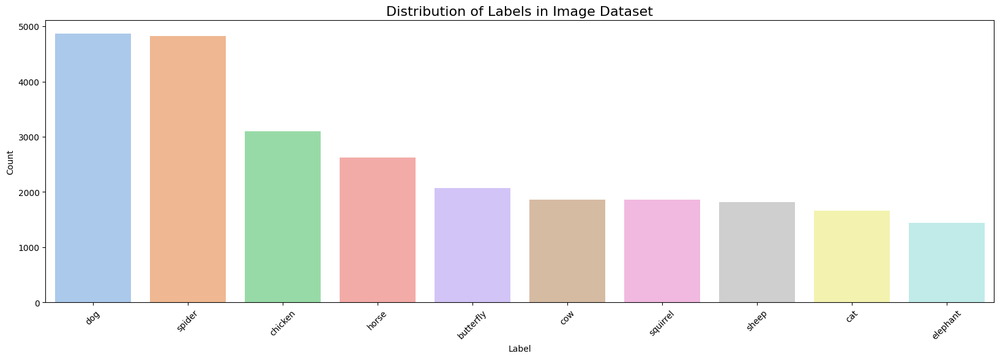

In [8]:
# Visualize Label Distribution
label_counts = image_df['label'].value_counts()
plt.figure(figsize=(20, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, palette='pastel')
plt.title('Distribution of Labels in Image Dataset', fontsize=16)
plt.xlabel('Label')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()



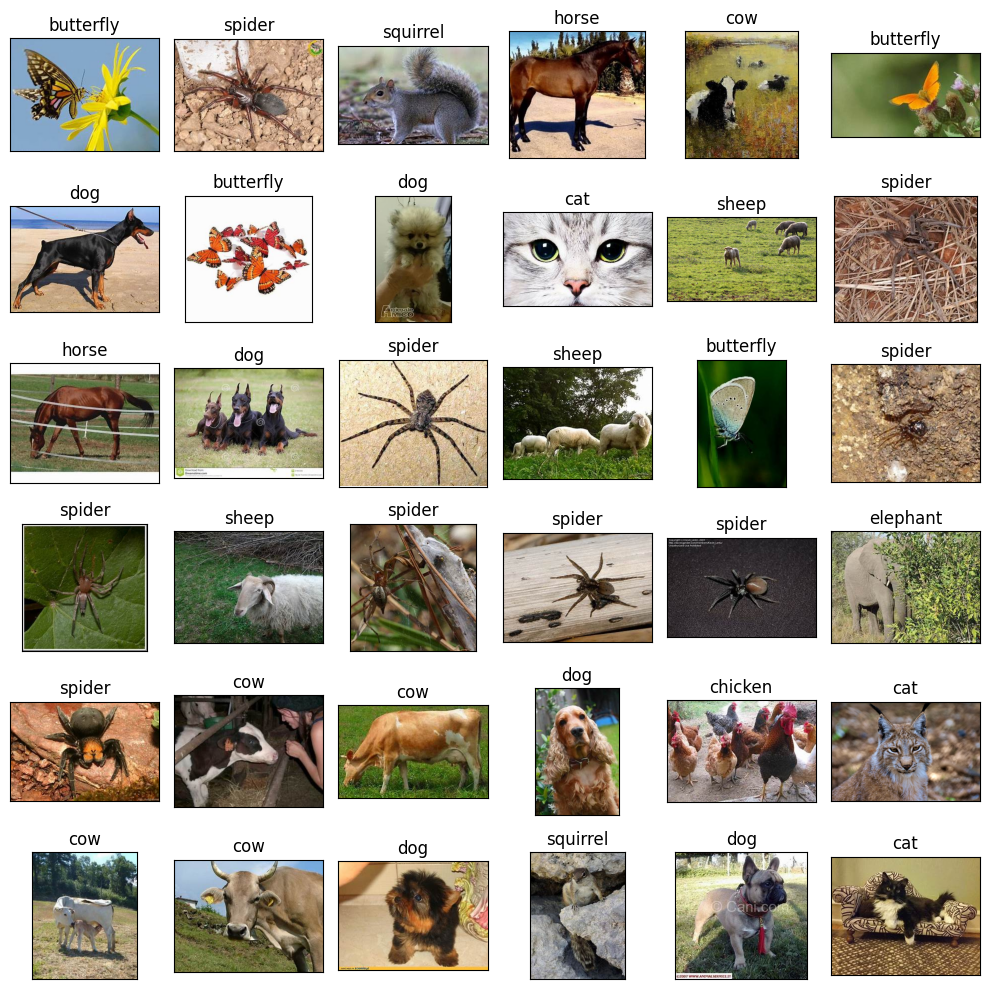

In [9]:
# Random Sample Grid
random_index = np.random.randint(0, len(image_df), 36)
fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(10, 10), subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.filename[random_index[i]]))
    ax.set_title(image_df.label[random_index[i]])
plt.tight_layout()
plt.show()



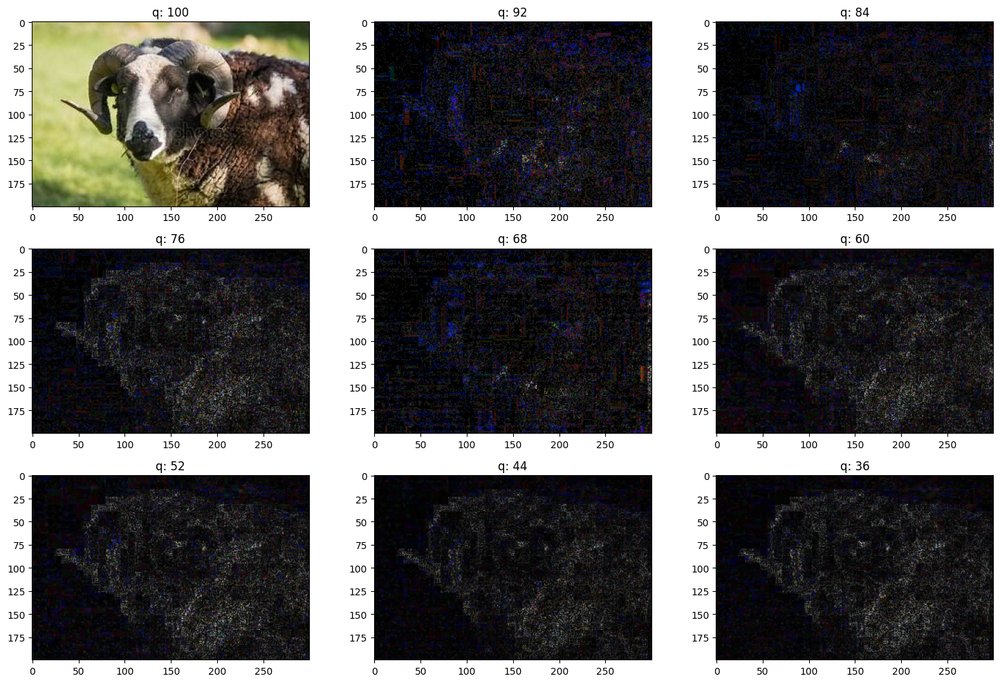

In [10]:
# ELA Analysis
def random_sample(dataset_path):
    all_images = list(Path(dataset_path).rglob("*.jpg")) + \
                 list(Path(dataset_path).rglob("*.jpeg")) + \
                 list(Path(dataset_path).rglob("*.JPG")) + \
                 list(Path(dataset_path).rglob("*.PNG"))
    return str(random.choice(all_images))

def compute_ela_cv(path, quality=90):
    original = Image.open(path).convert('RGB')
    resaved_path = 'temp_ela.jpg'
    original.save(resaved_path, 'JPEG', quality=quality)
    resaved = Image.open(resaved_path)
    ela_image = ImageChops.difference(original, resaved)
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0 / max_diff if max_diff != 0 else 1
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    return np.array(ela_image) / 255.0

p = random_sample(dir_dataset)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
fig = plt.figure(figsize=(15, 10))
for i in range(1, 10):
    quality = 100 - (i-1) * 8
    img = compute_ela_cv(p, quality=quality) if i > 1 else orig.copy()
    ax = fig.add_subplot(3, 3, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.tight_layout()
plt.show()

### Data Preprocessing

#### Split Dataset

Membagi Dataset menjadi 80% data_train, 10% data_test dan 10% validation

In [11]:
# Direktori dataset
dir_dataset = "/content/animal_dataset/raw-img"

# Ambil semua path gambar
all_images = glob.glob(os.path.join(dir_dataset, '*', '*.*'))

# Ambil nama folder (label) dari setiap path gambar
labels = [os.path.basename(os.path.dirname(path)) for path in all_images]

# Buat DataFrame
df = pd.DataFrame({'filename': all_images, 'label': labels})

# Bagi dataset: 80% train, 20% sisa
train_df, temp_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

# Dari sisa 20%, bagi menjadi 10% val dan 10% test
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'], random_state=42)

# Tampilkan jumlah data
print(f"Train     : {len(train_df)}")
print(f"Validation: {len(val_df)}")
print(f"Test      : {len(test_df)}")

Train     : 20943
Validation: 2618
Test      : 2618


In [12]:
# Ukuran gambar dan batch size
img_height, img_width = 224, 224
batch_size = 64

# ImageDataGenerator tanpa preprocessing pre-trained model
datagen = ImageDataGenerator(rescale=1./255)  # Normalisasi pixel dari 0-255 menjadi 0-1

# Data Augmentation
train_aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_aug = ImageDataGenerator(rescale=1./255)

# Generator untuk training
train_gen = train_aug.flow_from_dataframe(
    train_df,
    x_col='filename',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True
)

# Generator untuk validation
val_gen = val_aug.flow_from_dataframe(
    val_df,
    x_col='filename',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False
)

# Generator untuk testing
test_gen = val_aug.flow_from_dataframe(
    test_df,
    x_col='filename',
    y_col='label',
    target_size=(img_height, img_width),
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False
)

Found 20943 validated image filenames belonging to 10 classes.
Found 2618 validated image filenames belonging to 10 classes.
Found 2618 validated image filenames belonging to 10 classes.


## Modelling

In [13]:
# Compute class weights to handle class imbalance
labels_list = train_gen.classes
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(labels_list),
    y=labels_list
)
class_weights = dict(enumerate(class_weights))



In [14]:
base_model = MobileNetV2(input_shape=(img_height, img_width, 3),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = False

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [15]:
# CNN Model Architecture
model = models.Sequential([
    base_model,

    layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    layers.MaxPooling2D((2, 2)),

    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(len(train_gen.class_indices), activation='softmax')
])

In [16]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [17]:
# Callbacks
checkpoint_path = "animal_cnn_checkpoint.weights.h5"
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint(filepath=checkpoint_path, save_weights_only=True, save_best_only=True, monitor='val_accuracy'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
]


In [18]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    class_weight=class_weights,
    callbacks=callbacks
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1406s 4s/step - accuracy: 0.3990 - loss: 1.6565 - val_accuracy: 0.9305 - val_loss: 0.2604 - learning_rate: 1.0000e-04
Epoch 2/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1430s 4s/step - accuracy: 0.8502 - loss: 0.4988 - val_accuracy: 0.9381 - val_loss: 0.2149 - learning_rate: 1.0000e-04
Epoch 3/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1450s 4s/step - accuracy: 0.8865 - loss: 0.3884 - val_accuracy: 0.9416 - val_loss: 0.2060 - learning_rate: 1.0000e-04
Epoch 4/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1473s 4s/step - accuracy: 0.8998 - loss: 0.3307 - val_accuracy: 0.9408 - val_loss: 0.1938 - learning_rate: 1.0000e-04
Epoch 5/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1471s 4s/step - accuracy: 0.9104 - loss: 0.2989 - val_accuracy: 0.9431 - val_loss: 0.1988 - learning_rate: 1.0000e-04
Epoch 6/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1463s 4s/step - accuracy: 0.9139 - loss: 0.2922 - val_accuracy: 0.9419 - val_loss: 0.1945 - learning_rate: 1.0000e-04
Epoch 7/50
328/328 ━━━━━━━━━━━━━━━━━━━━ 1420s 4s/ste

## Evaluasi dan Visualisasi

In [19]:
results = model.evaluate(test_gen, verbose=0)

print("Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

Test Loss: 0.18291
Test Accuracy: 94.88%


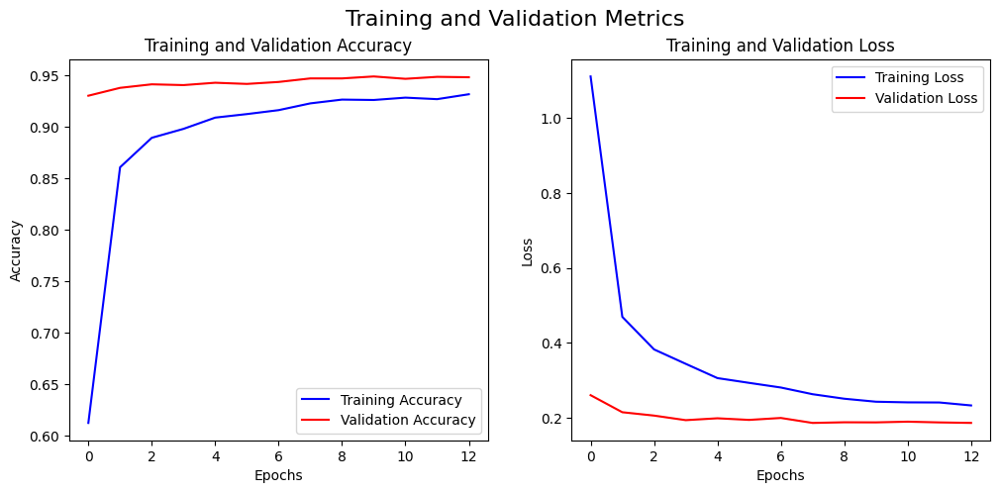

In [20]:
# Plot Training dan Validation Accuracy & Loss
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.plot(epochs, accuracy, 'b', label='Training Accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation Accuracy')
ax1.set_title('Training and Validation Accuracy')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Accuracy')
ax1.legend()

ax2.plot(epochs, loss, 'b', label='Training Loss')
ax2.plot(epochs, val_loss, 'r', label='Validation Loss')
ax2.set_title('Training and Validation Loss')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Loss')
ax2.legend()

fig.suptitle('Training and Validation Metrics', fontsize=16)
plt.show()


In [49]:
# Prediksi test set
pred = model.predict(test_gen)
pred = np.argmax(pred, axis=1)

# Map label index ke nama kelas
labels = (train_gen.class_indices)
labels = dict((v, k) for k, v in labels.items())

# Ubah prediksi index menjadi nama label (masih Italia)
pred_labels = [labels[k] for k in pred]




41/41 ━━━━━━━━━━━━━━━━━━━━ 150s 4s/step


In [50]:
# Buat DataFrame test
test_df = pd.DataFrame({
    "Filepath": test_gen.filepaths,
    "Label": [os.path.split(os.path.split(x)[0])[1] for x in test_gen.filepaths]
})


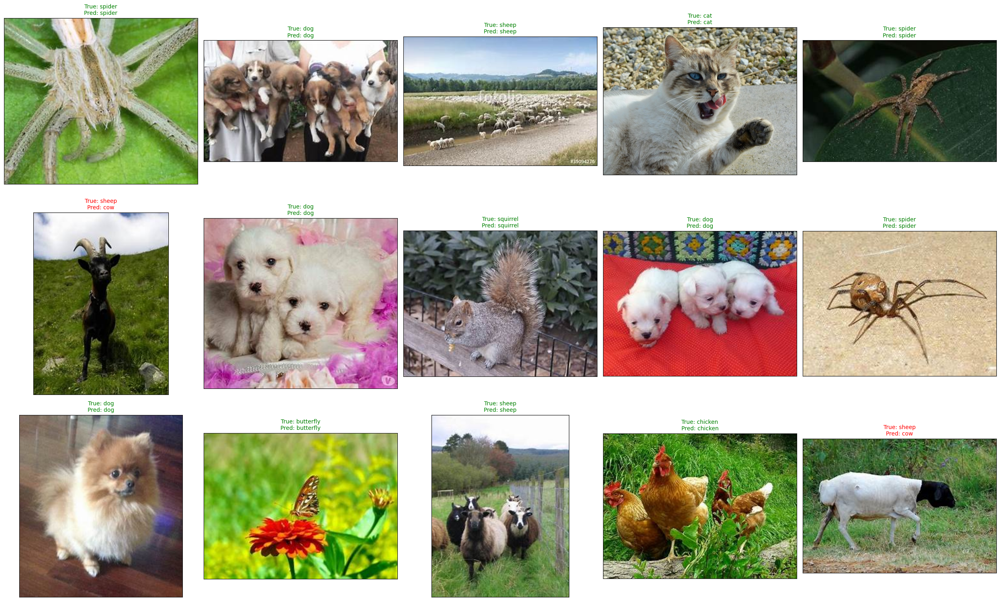

In [54]:
# Visualisasi random sample dari test set
random_index = np.random.randint(0, len(test_df), 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15), subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img = plt.imread(test_df.Filepath.iloc[random_index[i]])
    ax.imshow(img)

    # Translate true label dan predicted label
    true_label_italian = test_df.Label.iloc[random_index[i]]
    predicted_label_italian = pred_labels[random_index[i]]

    true_label = translate.get(true_label_italian, true_label_italian)
    predicted_label = translate.get(predicted_label_italian, predicted_label_italian)

    color = "green" if true_label == predicted_label else "red"
    ax.set_title(f"True: {true_label}\nPred: {predicted_label}", color=color, fontsize=10)

plt.tight_layout()
plt.show()

In [55]:
# Classification Report
y_test_italian = list(test_df.Label)
y_test = [translate.get(label, label) for label in y_test_italian]

pred_labels_english = [translate.get(label, label) for label in pred_labels]

# Classification Report
print(classification_report(y_test, pred_labels_english))

# Save report ke DataFrame
report = classification_report(y_test, pred_labels_english, output_dict=True)
df_report = pd.DataFrame(report).transpose()
display(df_report)

              precision    recall  f1-score   support

   butterfly       0.95      0.97      0.96       211
         cat       0.94      0.96      0.95       167
     chicken       0.97      0.96      0.97       310
         cow       0.81      0.94      0.87       186
         dog       0.99      0.94      0.97       487
    elephant       0.92      0.98      0.95       145
       horse       0.92      0.94      0.93       262
       sheep       0.90      0.87      0.89       182
      spider       1.00      0.97      0.98       482
    squirrel       0.95      0.95      0.95       186

    accuracy                           0.95      2618
   macro avg       0.94      0.95      0.94      2618
weighted avg       0.95      0.95      0.95      2618



,precision,recall,f1-score,support
butterfly,0.953488,0.971564,0.962441,211.000000
cat,0.941176,0.958084,0.949555,167.000000
chicken,0.973770,0.958065,0.965854,310.000000
cow,0.806452,0.940860,0.868486,186.000000
dog,0.993478,0.938398,0.965153,487.000000
elephant,0.922078,0.979310,0.949833,145.000000
horse,0.921053,0.935115,0.928030,262.000000
sheep,0.903409,0.873626,0.888268,182.000000
spider,0.997868,0.970954,0.984227,482.000000
squirrel,0.946237,0.946237,0.946237,186.000000


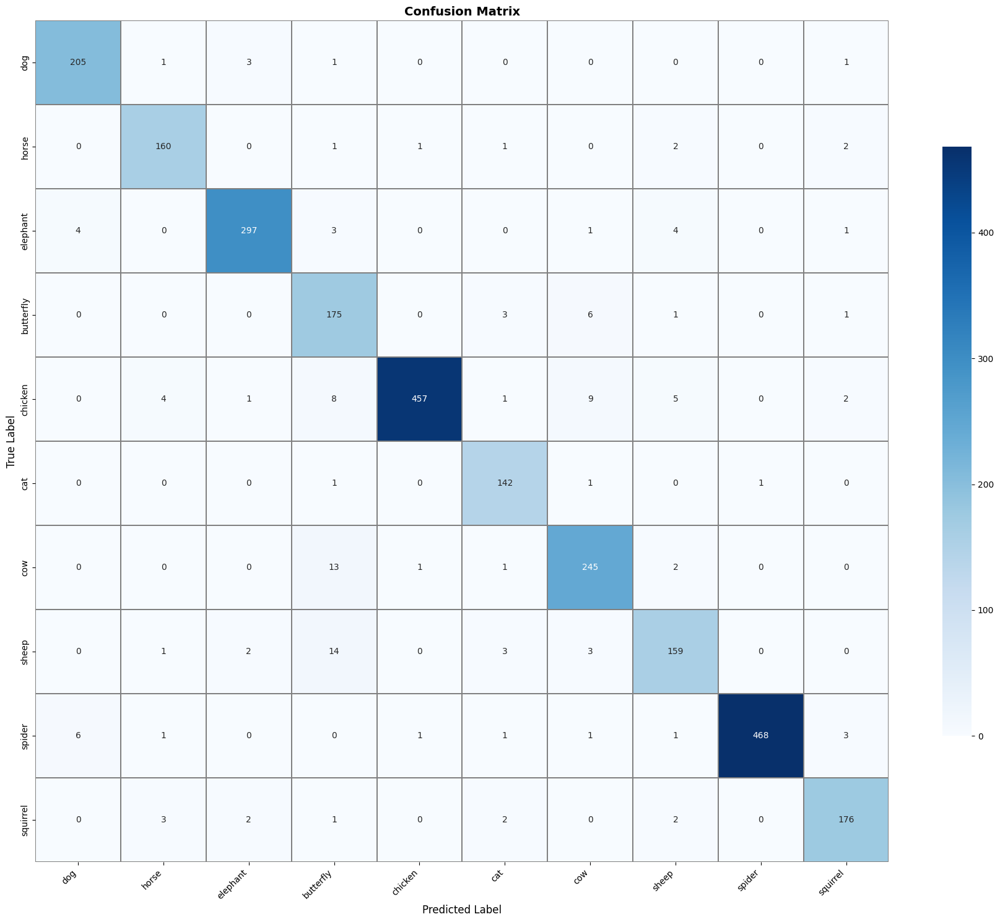

In [56]:
# Function Confusion Matrix
def make_confusion_matrix(y_true, y_pred, classes, figsize=(18, 15), fontsize=10):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=classes, yticklabels=classes,
                linewidths=0.3, linecolor='gray', cbar_kws={"shrink": 0.7})

    plt.ylabel("True Label", fontsize=fontsize+2)
    plt.xlabel("Predicted Label", fontsize=fontsize+2)
    plt.title("Confusion Matrix", fontsize=fontsize+4, weight='bold')
    plt.xticks(rotation=45, ha="right", fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.tight_layout()
    plt.show()

english_classes = [translate.get(label, label) for label in labels.values()]
make_confusion_matrix(y_test, pred_labels_english, english_classes)

## Konversi Model

In [35]:
# 1. Simpan model dalam format SavedModel
model.export("saved_model")
print("Model disimpan dalam format SavedModel.")

# Konversi ke TensorFlow.js
tfjs.converters.save_keras_model(model, "tfjs_model")
print("Model disimpan dalam format TensorFlow.js.")

# Konversi ke TensorFlow Lite
if not os.path.exists("tflite"):
    os.makedirs("tflite")

converter = tf.lite.TFLiteConverter.from_saved_model("saved_model")
tflite_model = converter.convert()

with open("tflite/model.tflite", "wb") as f:
    f.write(tflite_model)

print("Model disimpan dalam format TensorFlow Lite.")

# Membuat file label.txt di folder tflite
labels = [
    'cat', 'dog', 'elephant', 'horse', 'chicken',
    'squirrel', 'sheep', 'cow', 'butterfly', 'spider'
]

with open('tflite/label.txt', 'w') as f:
    for label in labels:
        f.write(label + '\n')

print("label.txt berhasil dibuat di folder tflite.")

Saved artifact at 'saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  140154567650832: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140155485219216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140155485220368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154567651024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154567651408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154567651216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154566327568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154566328144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140154566327952: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140155485219600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  14015548521998

Model disimpan dalam format SavedModel.
failed to lookup keras version from the file,
    this is likely a weight only file
Model disimpan dalam format TensorFlow.js.
Model disimpan dalam format TensorFlow Lite.
label.txt berhasil dibuat di folder tflite.


## Inference (Optional)

Randomly selected image: animal_dataset/raw-img/elefante/OIP-UapFVw9QIzrNcIjZkA3oHwHaHm.jpeg


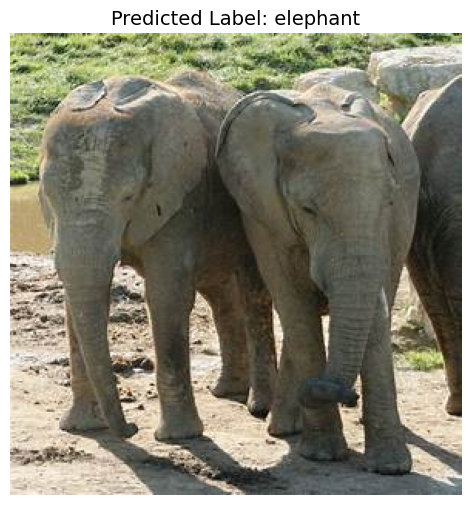

Predicted Index: 2
Predicted Label: elephant


In [44]:
# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="tflite/model.tflite")
interpreter.allocate_tensors()

# Load label
with open("tflite/label.txt", "r") as label_file:
    class_labels = [line.strip() for line in label_file.readlines()]

# Ambil detail input dan output
input_info = interpreter.get_input_details()
output_info = interpreter.get_output_details()

# Fungsi untuk preprocessing gambar
def prepare_image(img_path, img_size=(224, 224)):
    img = Image.open(img_path).convert('RGB')
    img = img.resize(img_size)
    img_array = np.array(img, dtype=np.float32) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Fungsi pilih gambar random dari folder
def tflite_predict_random_image(base_folder='animal_dataset/raw-img'):
    image_paths = []

    # Cari semua file gambar di semua subfolder
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            if file.lower().endswith(('jpg', 'jpeg', 'png')):
                image_paths.append(os.path.join(root, file))

    # Cek apakah ada gambar
    if not image_paths:
        print("Tidak ada gambar ditemukan di folder!")
        return

    # Pilih gambar random
    selected_image = random.choice(image_paths)
    print("Randomly selected image:", selected_image)

    # Preprocessing dan prediksi
    img_prepared = prepare_image(selected_image)
    interpreter.set_tensor(input_info[0]['index'], img_prepared)
    interpreter.invoke()

    prediction = interpreter.get_tensor(output_info[0]['index'])
    pred_idx = np.argmax(prediction)
    pred_label = class_labels[pred_idx]

    # Tampilkan hasil
    img = Image.open(selected_image)
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted Label: {pred_label}", fontsize=14)
    plt.show()

    print("Predicted Index:", pred_idx)
    print("Predicted Label:", pred_label)

# Panggil fungsi
tflite_predict_random_image()